In [1]:
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import scanpy as sc
import anndata
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sys
import seaborn as sns
from itertools import chain
#only needed  in development
import importlib # use like this: importlib.reload(typing_comparison.utils)

In [4]:
sys.path.insert(1, '/secure/projects/HTAPP_MBC/src/spatial')
from spatial_utils import *

In [5]:
sample="HTAPP-514-SMP-6760"

In [6]:
#These identifiers are set as defaults in many functions. If names are changed, this has to be adapted when calling the functions.
ct_column='cell_type'
sm_methods=["slide_seq","merfish","merfish_bin",'exseq','exseq_bin',"codex"] #spatial mathod names are hard-coded for now because some methods need special treatments. Can be fixed by giving eatch method it's own variable.
sc_method="scRNAseq"
he_method="HE_highres"
all_methods=[sc_method,*sm_methods,he_method]
all_methods

['scRNAseq',
 'slide_seq',
 'merfish',
 'merfish_bin',
 'exseq',
 'exseq_bin',
 'codex',
 'HE_highres']

In [7]:
out_dir=out_dir_base+sample
os.makedirs(out_dir, exist_ok=True)

## Align and prep data

In [8]:
#get the data without processing (Filter: min_genes=30 min_cells=3 but further reduce low count obs if more than 35%)
adatas=get_and_process_data(sample,data_dir,out_dir,methods=all_methods,process=False)

reading  scRNAseq  from buffer
reading  slide_seq  from buffer
reading  merfish  from buffer
reading  merfish_bin  from buffer
reading  exseq  from buffer
reading  exseq_bin  from buffer
reading  codex  from buffer
Loading processed HE_highres
Loading processed HE_highres


In [9]:
#select colors for single cell
sel_colors=colors[colors.index.isin(adatas[sc_method].obs[ct_column])]
adatas[sc_method].obs[ct_column]=pd.Categorical(adatas[sc_method].obs[ct_column], categories=sel_colors.index,ordered=True)
adatas[sc_method].uns[ct_column+"_colors"]=list(sel_colors.values)

In [10]:
# adjust codex resolution (1/2 resolution of all other samples)
adatas['codex'].obs.x_orig=adatas['codex'].obs.x_orig*2
adatas['codex'].obs.y_orig=adatas['codex'].obs.y_orig*2

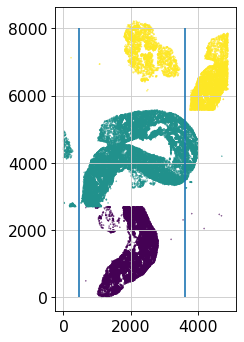

In [11]:
#check codex original positions
fig,ax=plt.subplots(figsize=(5,5))
ax.scatter(adatas['codex'].obs.x_orig,adatas['codex'].obs.y_orig,c=adatas['codex'].obs.region,s=0.1)
ax.set_aspect(1)
ax.vlines(x=3600,ymin=0, ymax=8000)
ax.vlines(x=450,ymin=0, ymax=8000)

In [12]:
#remove overlapping codex data from region 3
adatas['codex']=adatas['codex'][~ ((adatas['codex'].obs.region==3) & (adatas['codex'].obs.x_orig>3600))].copy()
adatas['codex']=adatas['codex'][~ ((adatas['codex'].obs.region==2) & (adatas['codex'].obs.x_orig<450))].copy()

In [10]:
#Note: the pre-applied HE scaling factor is 0.4 per default. Take this into account to align to a differently scaled HE. 

registration=pd.DataFrame(index=[i for i in list(replicate_splitter(adatas).index) if not (sc_method in i)] , 
                          columns=["crop_left","crop_right","crop_top","crop_bottom","scale","shift_x","shift_y","degrees","flip"])
#HE 1
registration.loc["HE 1","crop_left"]=100
registration.loc["HE 1","crop_right"]=0
registration.loc["HE 1","crop_top"]=0
registration.loc["HE 1","crop_bottom"]=0
registration.loc["HE 1","scale"]=0.6905#0.72
registration.loc["HE 1","degrees"]=0

#HE 2
registration.loc["HE 2","crop_left"]=180
registration.loc["HE 2","crop_right"]=0
registration.loc["HE 2","crop_top"]=0
registration.loc["HE 2","crop_bottom"]=350
registration.loc["HE 2","scale"]=0.6905#0.72
registration.loc["HE 2","degrees"]=-3 

#Annotation HE 1
registration.loc["HE 1 annot","crop_left"]=0
registration.loc["HE 1 annot","crop_right"]=0
registration.loc["HE 1 annot","crop_top"]=0
registration.loc["HE 1 annot","crop_bottom"]=0
registration.loc["HE 1 annot","scale"]=registration.loc["HE 1","scale"]/0.72
registration.loc["HE 1 annot","degrees"]=0


#Annotation HE 2
registration.loc["HE 2 annot","crop_left"]=0
registration.loc["HE 2 annot","crop_right"]=0
registration.loc["HE 2 annot","crop_top"]=0
registration.loc["HE 2 annot","crop_bottom"]=0
registration.loc["HE 2 annot","scale"]=registration.loc["HE 2","scale"]/0.72
registration.loc["HE 2 annot","degrees"]=0

#slide_seq 1
registration.loc["slide_seq 1","shift_x"]=760
registration.loc["slide_seq 1","shift_y"]=2170
registration.loc["slide_seq 1","degrees"]=8

#slide_seq 2
registration.loc["slide_seq 2","shift_x"]=450
registration.loc["slide_seq 2","shift_y"]=1670
registration.loc["slide_seq 2","degrees"]=162

#merfish 2
registration.loc["merfish 2","shift_x"]=350
registration.loc["merfish 2","shift_y"]=-1200
registration.loc["merfish 2","degrees"]=-109

#merfish_bin 2
registration.loc["merfish_bin 2","shift_x"]=250
registration.loc["merfish_bin 2","shift_y"]=-1400
registration.loc["merfish_bin 2","degrees"]=-109

#exseq 2
registration.loc["exseq 2","shift_x"]=2600
registration.loc["exseq 2","shift_y"]=2750
registration.loc["exseq 2","degrees"]=0
registration.loc["exseq 2","flip"]="h"

#exseq_bin 2
registration.loc["exseq_bin 2","shift_x"]=2600
registration.loc["exseq_bin 2","shift_y"]=2750
registration.loc["exseq_bin 2","degrees"]=0
registration.loc["exseq_bin 2","flip"]="h"

#codex 2
registration.loc["codex 2","shift_x"]=(-350,2430,2750)
registration.loc["codex 2","shift_y"]=(1620,-2260,-2400)
registration.loc["codex 2","degrees"]=(-86,-86,-86)

reg_file=out_dir+"/"+sample+"_registration.csv"
if os.path.isfile(reg_file)&False:
    print("Reading registation.")
    registration=pd.read_csv(reg_file,index_col=0)
else:
    print("Writing registration.")
    registration.to_csv(reg_file)

Writing registration.


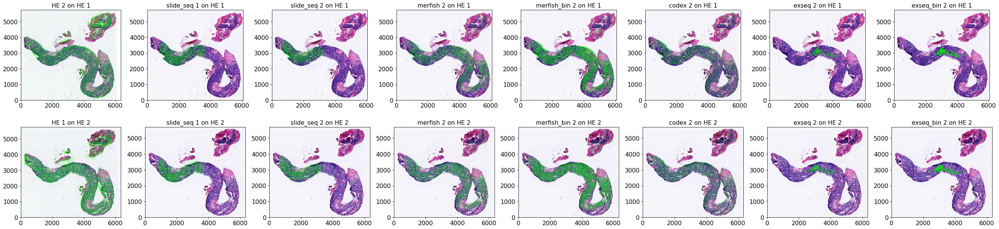

In [12]:
aligner(adatas,img_idx="HE 1",img_idx2="HE 2",dat_idxs=["slide_seq 1","slide_seq 2","merfish 2","merfish_bin 2","codex 2","exseq 2","exseq_bin 2"],registration=registration,figsize=(42,9),dot_sizes=[0.1,0.1,0.1,0.005,0.05,8,0.1],adjust=False,change=True)

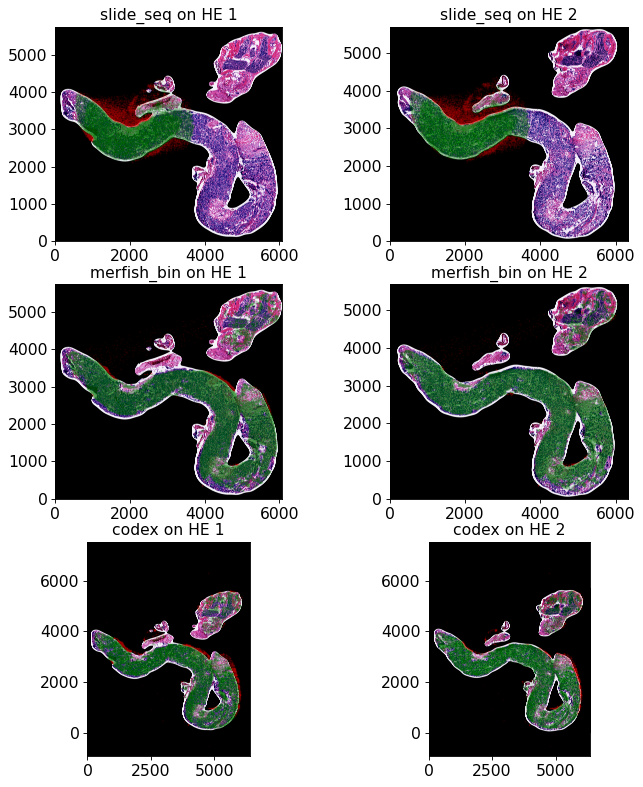

In [15]:
create_mask(adatas, ["HE 1","HE 2"],dat_idxs=["slide_seq",'merfish_bin',"codex"],figsize=(10,12),dot_sizes=[0.03],s=70,t=0.8,long=True)

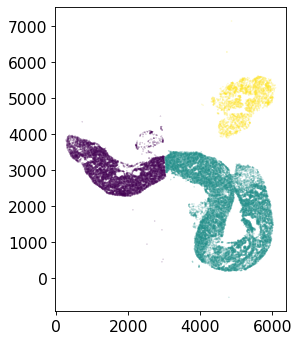

In [16]:
#check codex for overlaps
fig,ax=plt.subplots(figsize=(5,5))
ax.scatter(adatas['codex'].obs.x,adatas['codex'].obs.y,c=adatas['codex'].obs.region,s=0.01)
ax.grid(False)
ax.set_aspect(1)

In [38]:
add_annotations(adatas,sample,dat_idxs=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"],registration=registration)

Fat
Vasculature
Tumor
Fibrosis
Unidentifiable
ImmuneCells
Tumor
Unidentifiable
Fibrosis
Fat
Vasculature
ImmuneCells


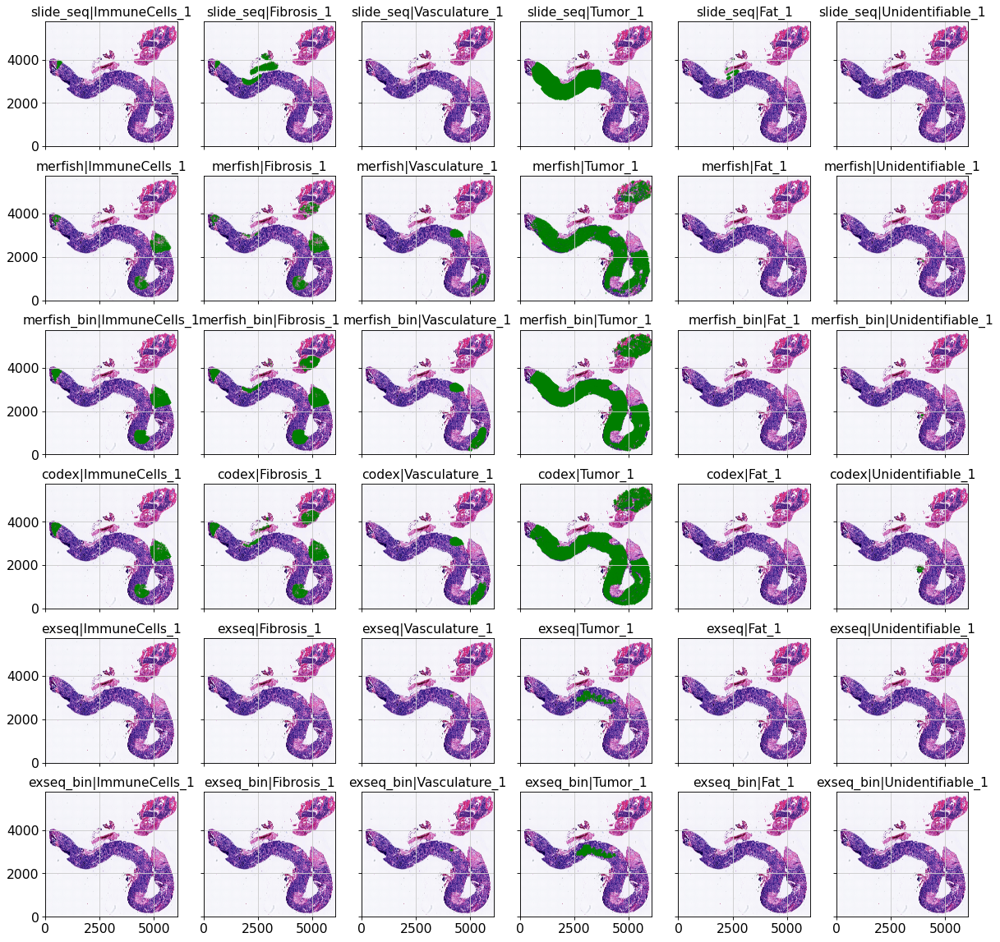

In [41]:
plot_annnotation(adatas,dat_idxs=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"],annots=["ImmuneCells_1","Fibrosis_1","Vasculature_1","Tumor_1","Fat_1","Unidentifiable_1"],HE="HE 1",figsize=[18,18],s=0.05)

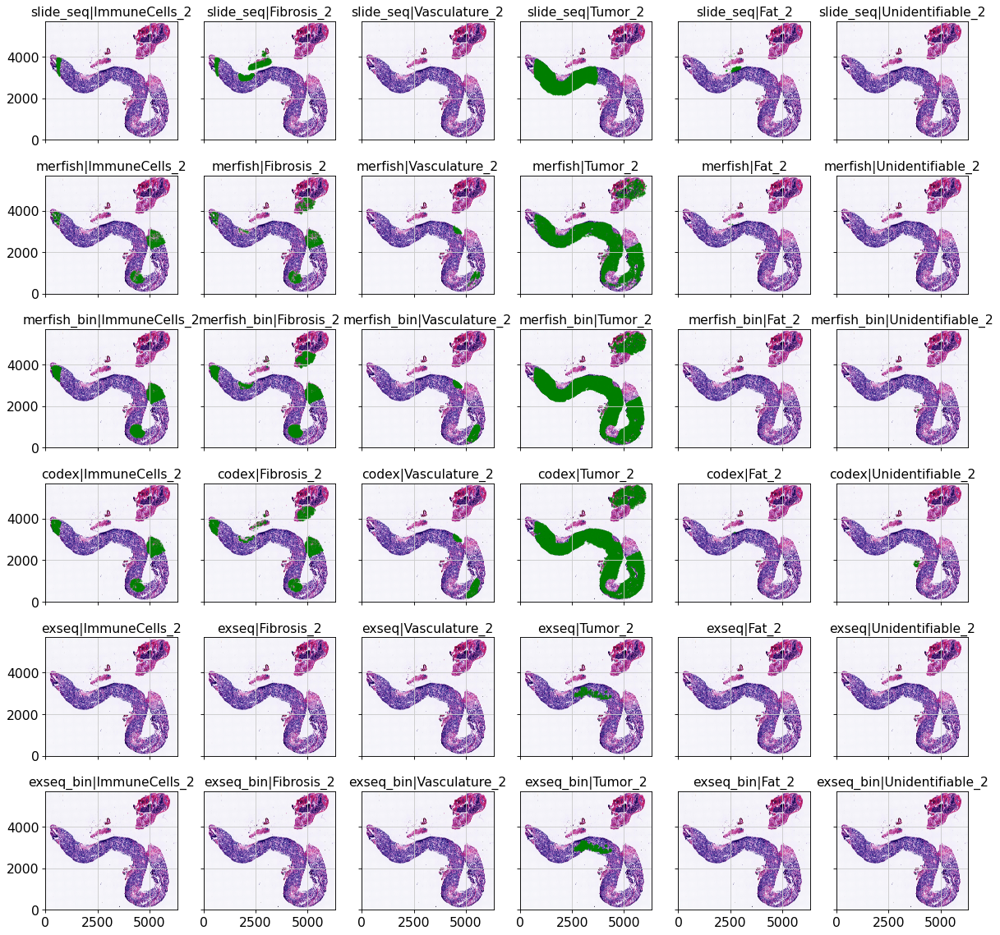

In [42]:
plot_annnotation(adatas,dat_idxs=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"],annots=["ImmuneCells_2","Fibrosis_2","Vasculature_2","Tumor_2","Fat_2","Unidentifiable_2"],HE="HE 2",figsize=[18,18],s=0.05)

In [20]:
adatas=update_processed_adatas(adatas,sample,out_dir,all_methods,overwrite=True,process=True)

Processing scRNAseq
No HE masks found. Not trimming data.


Trying to set attribute `.obs` of view, copying.


Processing slide_seq
Processing merfish
No HE masks found. Not trimming data.


Trying to set attribute `.obs` of view, copying.


Processing merfish_bin


Trying to set attribute `.obs` of view, copying.


Processing codex
Normalization turned off.


In [43]:
adatas=update_processed_adatas(adatas,sample,out_dir,["exseq","exseq_bin"],overwrite=True,process=True)

Processing exseq
No HE masks found. Not trimming data.
Processing exseq_bin
No HE masks found. Not trimming data.


## Load the processed data

In [8]:
adatas=get_and_process_data(sample,data_dir,out_dir,methods=all_methods)

reading  scRNAseq  from buffer
reading  slide_seq  from buffer
reading  merfish  from buffer
reading  merfish_bin  from buffer
reading  exseq  from buffer
reading  exseq_bin  from buffer
reading  codex  from buffer
Loading processed HE_highres
Loading processed HE_highres


## Look at the data

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


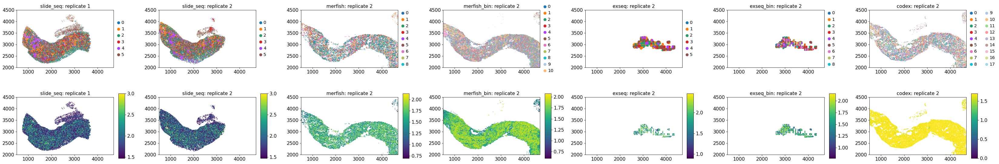

In [51]:
plot_spatial_obs(adatas,sm_methods,axsize=(4,3),wspace=0.2,x_shifts=[0,-0.015],xlim=(500,4700),ylim=(2000,4500))

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


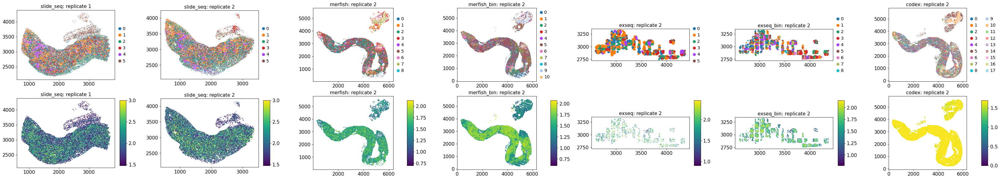

In [52]:
plot_spatial_obs(adatas,sm_methods,axsize=(4,3),wspace=0.2,x_shifts=[0,-0.015])

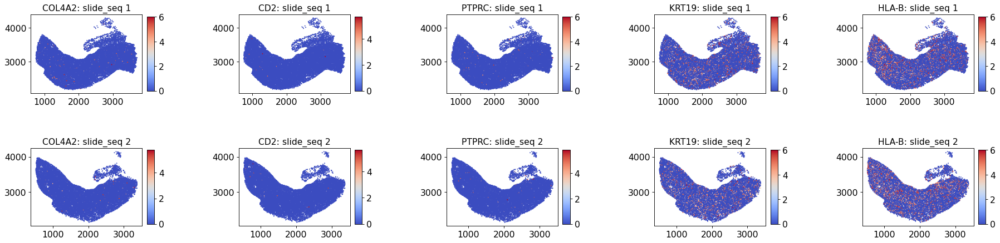

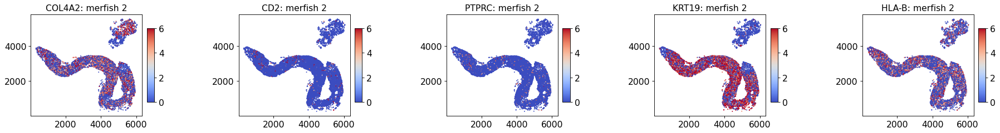

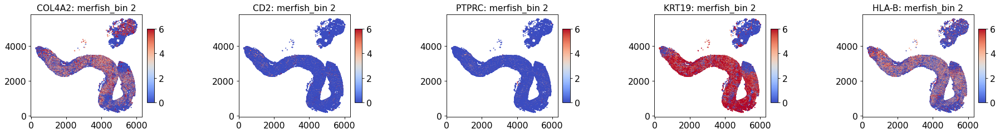

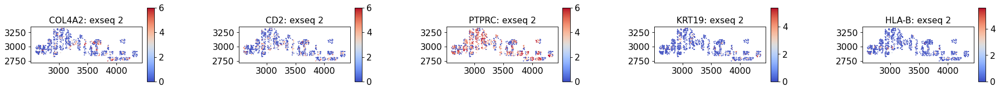

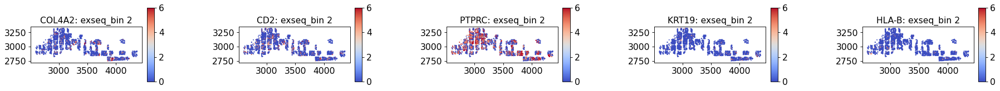

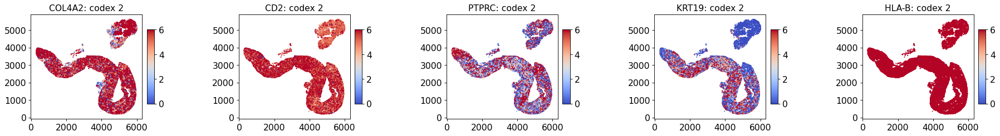

In [53]:
plot_spatial_genes(adatas,methods=sm_methods,genes = ["COL4A2","CD2","PTPRC","KRT19","HLA-B"],axsize=(2.5,2.5),x_shifts=[0,-0.04]);

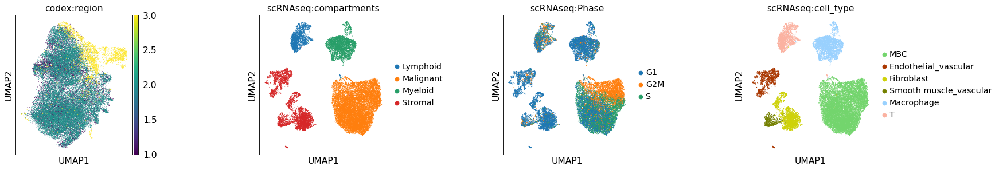

In [14]:
plot_variable_individual(adatas,method_vars=[("codex","region"),("scRNAseq","compartments"),("scRNAseq","Phase"),("scRNAseq","cell_type")])

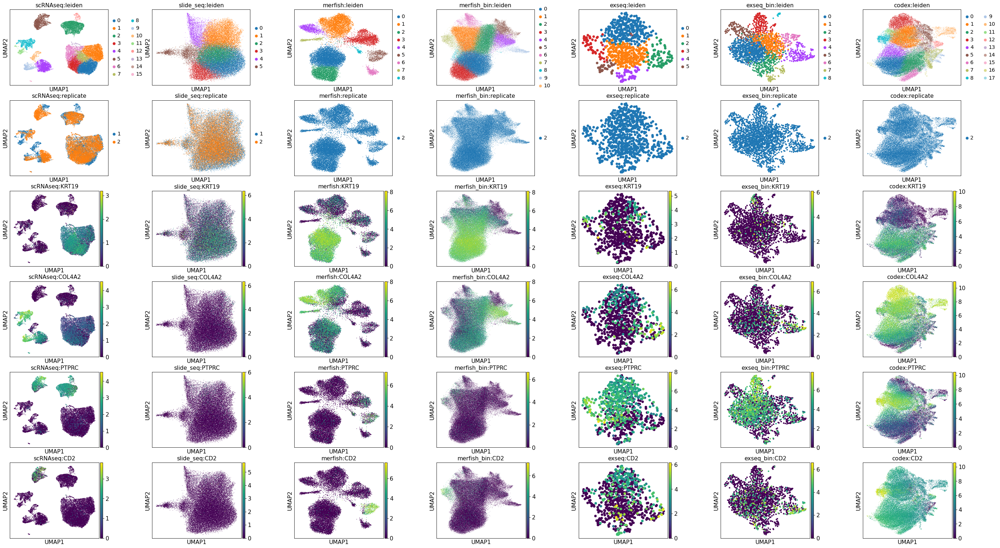

In [11]:
plot_variable_grid(adatas,methods=[sc_method,*sm_methods],variables=['leiden','replicate','KRT19','COL4A2','PTPRC','CD2'],gridspec_kw={'wspace':0.45,'hspace':0.2})

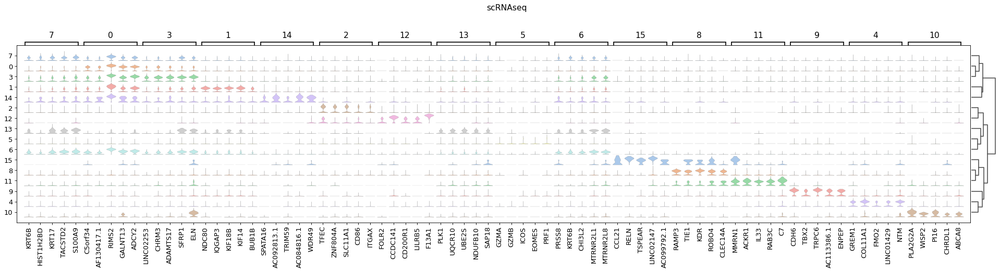

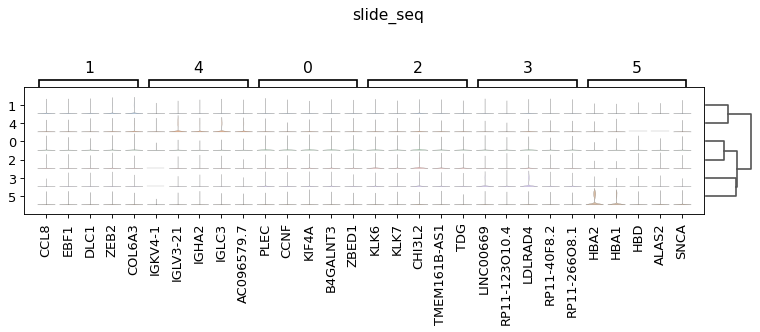

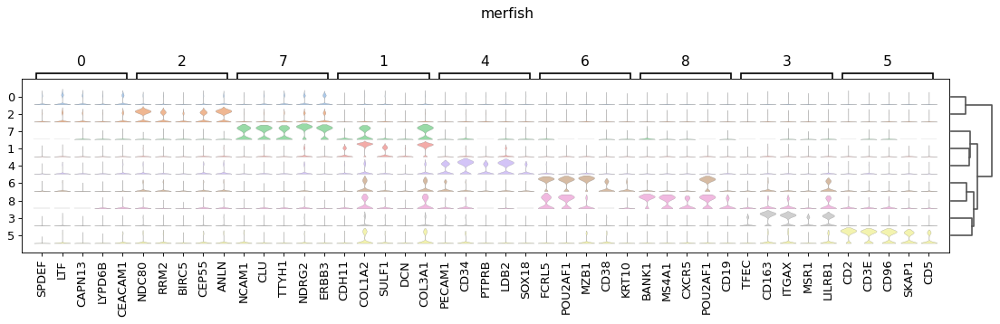

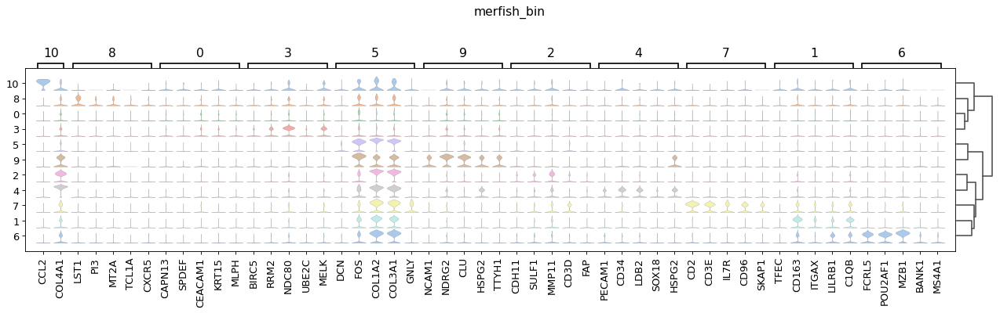

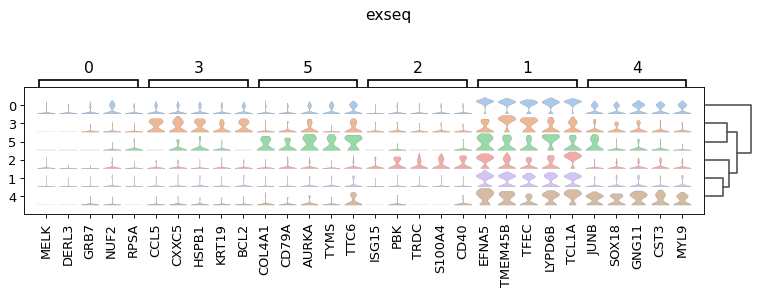

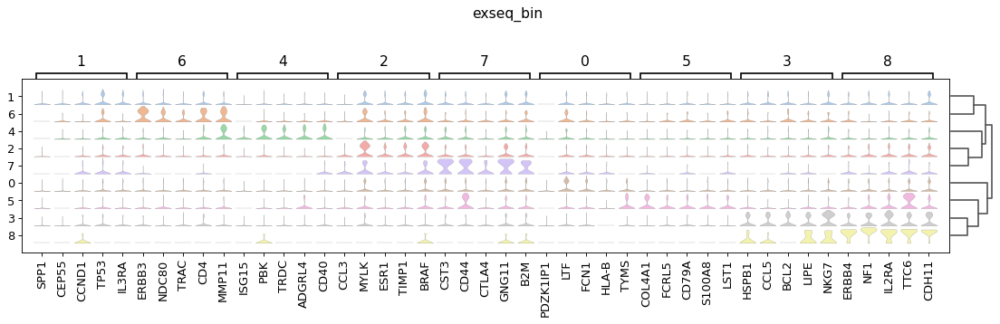

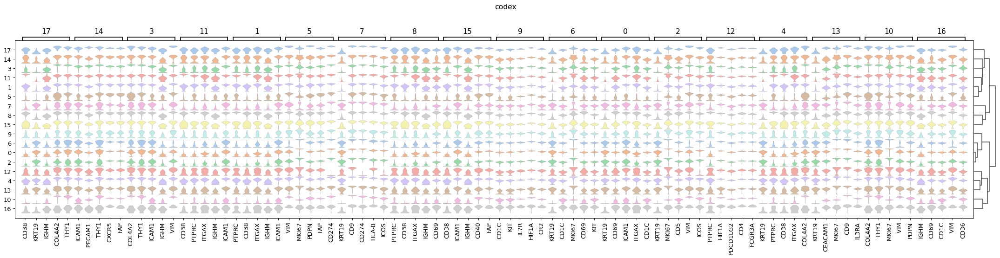

In [12]:
get_sub_markers(adatas,methods=[sc_method,*sm_methods],rest_thres=1)